In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('C:\lab\\aigo\\30_Training Dataset_V2\\training_data.csv')
test_data = pd.read_csv('C:\lab\\aigo\\30_Public Dataset_Public Sumission Template_v2\public_dataset.csv')

df.columns

Index(['ID', '縣市', '鄉鎮市區', '路名', '土地面積', '使用分區', '移轉層次', '總樓層數', '主要用途',
       '主要建材', '建物型態', '屋齡', '建物面積', '車位面積', '車位個數', '橫坐標', '縱坐標', '備註',
       '主建物面積', '陽台面積', '附屬建物面積', '單價'],
      dtype='object')

In [11]:
df['路名'].value_counts()

路名
中正路       165
民族路        58
文化三路一段     54
景平路        48
中山路一段      48
         ... 
如意街         1
嘉勤南路        1
大厝          1
裕民二路        1
弘孝路         1
Name: count, Length: 3059, dtype: int64

In [3]:
group_city = df.groupby(['縣市'])['單價'].agg(['min', 'max', 'mean', 'median']).reset_index()
group_city = group_city.rename(columns={'min': '縣市最低單價', 'max': '縣市最高單價', 'mean':'縣市平均單價', 'median':'縣市單價中位數'})
print(group_city)

group_Township = df.groupby(['縣市', '鄉鎮市區'])['單價'].agg(['min', 'max', 'mean', 'median']).reset_index()
group_Township = group_Township.rename(columns={'min': '鄉鎮市區最低單價', 'max': '鄉鎮市區最高單價', 'mean':'鄉鎮市區平均單價', 'median':'鄉鎮市區單價中位數'})
print(group_Township)

group_road = df.groupby(['縣市', '鄉鎮市區', '路名'])['單價'].agg(['min', 'max', 'mean', 'median']).reset_index()
group_road = group_road.rename(columns={'min': '該路段最低單價', 'max': '該路段最高單價', 'mean':'該路段平均單價', 'median':'該路段單價中位數'})
print(group_road)

     縣市    縣市最低單價     縣市最高單價    縣市平均單價   縣市單價中位數
0   台中市  0.669278   3.339466  1.473137  1.418804
1   台北市  0.856659  12.263516  3.395855  3.222352
2   台南市  0.177415  13.622033  1.233745  1.161154
3   嘉義市  0.669278   1.189262  0.816754  0.809814
4   嘉義縣  0.622432   0.997195  0.809814  0.809814
5   基隆市  0.575587   2.051217  1.036863  0.973773
6   宜蘭縣  0.622432   1.980949  1.098314  1.020618
7   屏東縣  0.603694   1.104940  0.791844  0.762968
8   彰化縣  0.739546   1.348536  0.927538  0.926927
9   新北市  0.435051   4.393487  1.976991  1.934104
10  新竹市  0.631801   3.034971  1.670579  1.582763
11  新竹縣  0.599009   3.034971  1.839481  1.873205
12  桃園市  0.177415   2.496248  1.322870  1.301691
13  花蓮縣  0.762968   1.442227  1.053800  1.055752
14  苗栗縣  0.659908   1.582763  1.078903  1.058094
15  金門縣  0.856659   1.582763  1.171773  1.149443
16  雲林縣  0.435051   0.622432  0.528741  0.528741
17  高雄市  0.285145   2.285444  1.252643  1.245476
      縣市 鄉鎮市區  鄉鎮市區最低單價  鄉鎮市區最高單價  鄉鎮市區平均單價  鄉鎮市區單價中位數
0    台中市   中區 

In [4]:
# 将处理后的数据连接回原始DataFrame
df = df.merge(group_city, on=['縣市'], how='left')
df = df.merge(group_Township, on=['縣市', '鄉鎮市區'], how='left')
df = df.merge(group_road, on=['縣市', '鄉鎮市區', '路名'], how='left')


In [5]:
print(df.shape)
print(test_data.shape)

train_columns = set(df.columns)
test_columns = set(test_data.columns)
train_columns-test_columns

(11751, 34)
(5876, 21)


{'單價',
 '縣市單價中位數',
 '縣市平均單價',
 '縣市最低單價',
 '縣市最高單價',
 '該路段單價中位數',
 '該路段平均單價',
 '該路段最低單價',
 '該路段最高單價',
 '鄉鎮市區單價中位數',
 '鄉鎮市區平均單價',
 '鄉鎮市區最低單價',
 '鄉鎮市區最高單價'}

In [6]:
# test data 也許含有train data的縣市鄉鎮等地區的平均單價、最高單價、最低單價、單價中位數
test_data = test_data.merge(group_city, on=['縣市'], how='left')
test_data = test_data.merge(group_Township, on=['縣市', '鄉鎮市區'], how='left')
test_data = test_data.merge(group_road, on=['縣市', '鄉鎮市區', '路名'], how='left')

In [7]:
print(df.shape)
print(test_data.shape)

train_columns = set(df.columns)
test_columns = set(test_data.columns)
train_columns-test_columns

(11751, 34)
(5876, 33)


{'單價'}

In [8]:
df.to_csv('C:\lab\\aigo\\30_Training Dataset_V2\\training_data_processed.csv', index=False)
test_data.to_csv('C:\lab\\aigo\\30_Public Dataset_Public Sumission Template_v2\public_dataset_processed.csv', index=False)

## 資料前處理

In [ ]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()

In [ ]:
# 使用 LabelEncoder 將文字資料轉換為數值
col_list = ['縣市', '鄉鎮市區', '路名', '主要用途', '主要建材', '建物型態']

def oneHotEncode(df, col_list):
    df = pd.get_dummies(df, columns=col_list,dtype=int)
    return df


def labelEncode(df, col_list):
    for col in col_list:
        df[col] = labelencoder.fit_transform(df[col])
    return df


# 處理數值特徵的偏移值
# 將負數進行平移，使其成為正數，並與正數保持平移前的相對關係
def offset_cal(df, col_list):
    for col in col_list:
        offset = abs(min(df[col]))
        df[col] = df[col] + offset
    return df


In [ ]:
# 用於解決因使用dummies導致資料得column不一致的狀態，為data加上不存在的col，並補上0的值
def make_columns_consistent(data_1st, data_2nd, default_value = 0):
    # 取得train data、test data的column name
    train_columns = set(data_1st.columns)
    test_columns = set(data_2nd.columns)

    # 檢查兩個data中是否存在額外的column
    missing_columns_1st = test_columns - train_columns
    missing_columns_2nd = train_columns - test_columns

    # 將存在於data_2nd 但不存在data_1st的column加入 data_1st，並將該值設為0
    for col in missing_columns_1st:
        data_1st[col] = default_value  # 可以根据问题需要设置不同的默认值
    
    # 將存在於data_1st 但不存在data_2nd的column加入 data_2nd，並將該值設為0
    for col in missing_columns_2nd:
        data_2nd[col] = default_value  # 可以根据问题需要设置不同的默认值

    return data_1st,data_2nd

#### train data 前處理

In [ ]:
col_list = ['縣市', '鄉鎮市區', '主要用途', '主要建材', '建物型態']
df = oneHotEncode(df, col_list)

col_list = ['路名']
df = labelEncode(df, col_list)

# 處理數值特徵的偏移值
offset_col = ['土地面積', '建物面積', '車位面積', '主建物面積', '陽台面積', '附屬建物面積']
df = offset_cal(df, offset_col)

# 刪除ID、string的資料
df = df.drop(['ID', '使用分區', '備註'], axis=1)

x = df.drop(['單價'], axis=1)
y = df['單價']

#### test data 前處理

In [ ]:
col_list = ['縣市', '鄉鎮市區', '主要用途', '主要建材', '建物型態']
# test_data = labelEncode(test_data, col_list)
test_data = oneHotEncode(test_data, col_list)

col_list = ['路名']
test_data = labelEncode(test_data, col_list)

# 處理數值特徵的偏移值
offset_col = ['土地面積', '建物面積', '車位面積', '主建物面積', '陽台面積', '附屬建物面積']
test_data = offset_cal(test_data, offset_col)

# 刪除ID、string的資料
test_data = test_data.drop(['ID', '使用分區', '備註'], axis=1)

In [ ]:
print("x.shape: ",x.shape)
print("test_data.shape: ",test_data.shape)

In [ ]:
# 解決因使用dummies導致資料得column不一致的狀態
x, test_data = make_columns_consistent(x, test_data)

In [ ]:
print("x.shape: ",x.shape)
print("x.shape: ",x.shape[1])
print("test_data.shape: ",test_data.shape)

c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Catego

c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\events.py:93: UserWarning: Glyph 22303 (\N{CJK UNIFIED IDEOGRAPH-571F}) missing from current font.
  func(*args, **kwargs)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\events.py:93: UserWarning: Glyph 22320 (\N{CJK UNIFIED IDEOGRAPH-5730}) missing from current font.
  func(*args, **kwargs)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\events.py:93: UserWarning: Glyph 38754 (\N{CJK UNIFIED IDEOGRAPH-9762}) missing from current font.
  func(*args, **kwargs)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\events.py:93: UserWarning: Glyph 31309 (\N{CJK UNIFIED IDEOGRAPH-7A4D}) missing from current font.
  func(*args, **kwargs)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\events.py:93: UserWarning: Glyph 31227 (\N{CJK UNIFIED IDEOGRAPH-79FB}) missing from current font.
  func(*args, **kwargs)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packa

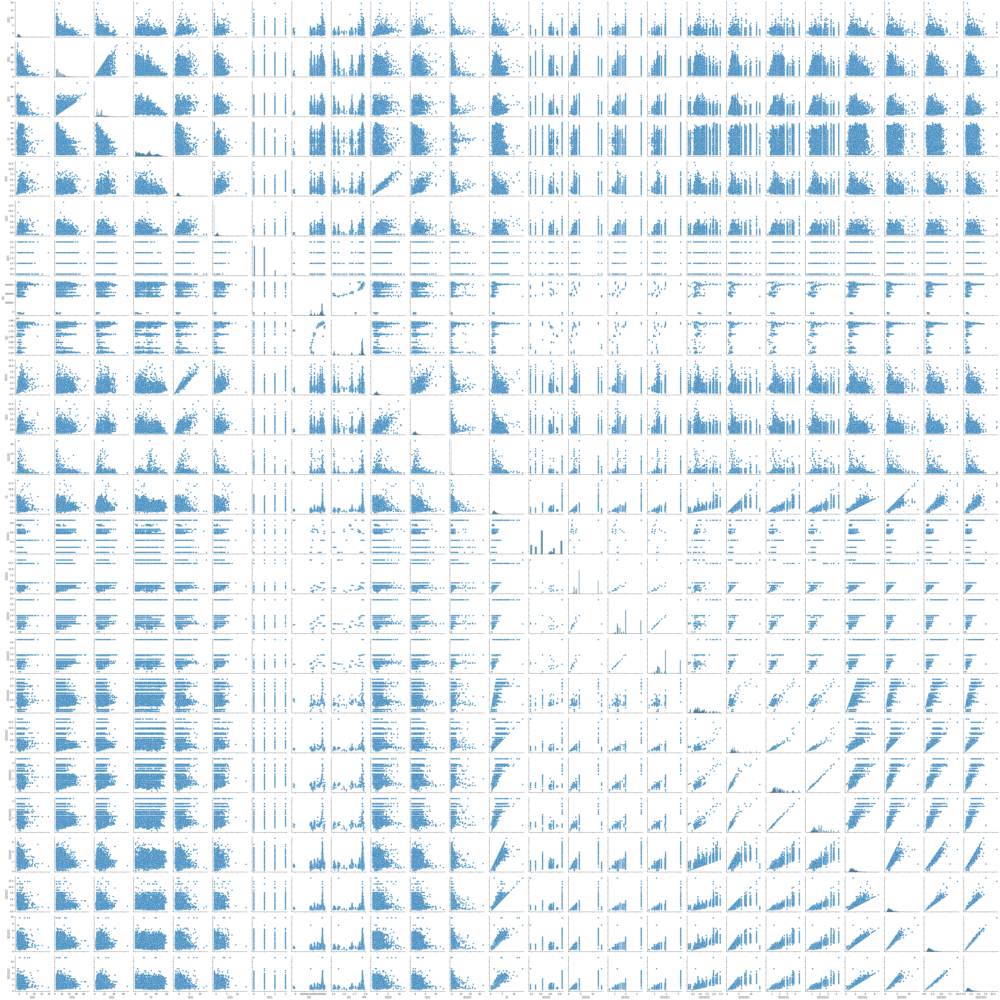

In [9]:
#使用pairplot探索數字型資料之間有沒有任何趨勢
sns.pairplot(df)

C:\Users\JUNG\AppData\Local\Temp\ipykernel_19740\2025930479.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['單價'])
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_i

<Axes: xlabel='單價', ylabel='Density'>

c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\events.py:93: UserWarning: Glyph 21934 (\N{CJK UNIFIED IDEOGRAPH-55AE}) missing from current font.
  func(*args, **kwargs)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\events.py:93: UserWarning: Glyph 20729 (\N{CJK UNIFIED IDEOGRAPH-50F9}) missing from current font.
  func(*args, **kwargs)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 21934 (\N{CJK UNIFIED IDEOGRAPH-55AE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\JUNG\anaconda3\envs\env_dl\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 20729 (\N{CJK UNIFIED IDEOGRAPH-50F9}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


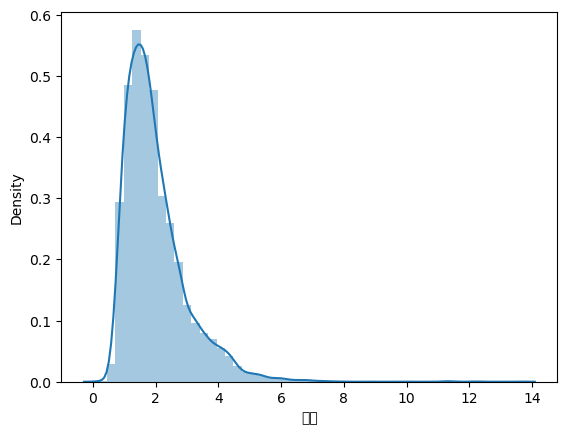

In [10]:
#利用distplot來看房價主要集中的區間
sns.distplot(df['單價'])

In [ ]:
#利用df.corr()先做出各變數間的關係係數，再用heatmap作圖
sns.heatmap(df.corr(),annot=True)